<a href="https://colab.research.google.com/github/abkimc/CV-course-test-prepration/blob/main/Image_processing_lecture_3_%2B_4_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Lecture 3

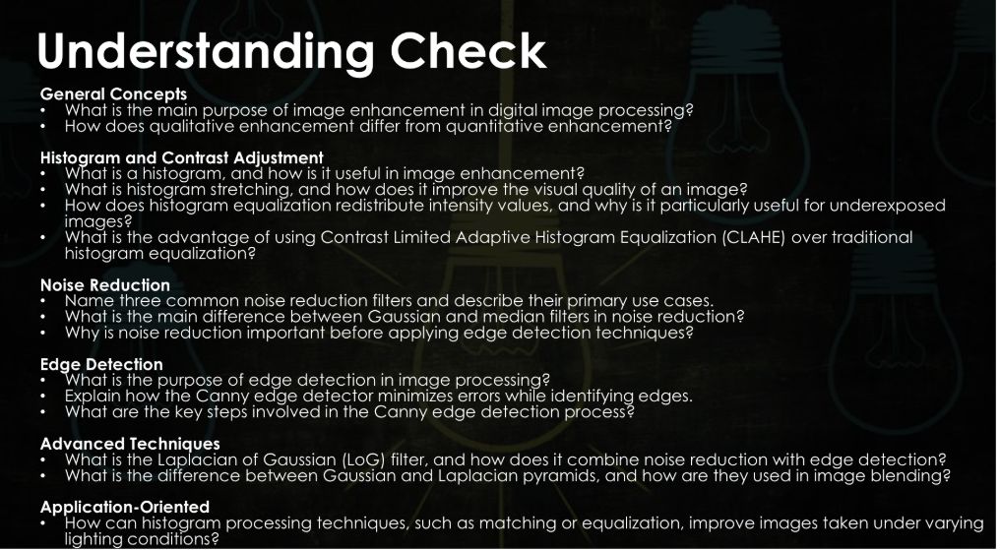

In [ ]:
# Genral concepts
"""
1) the main poruse of image enhancement is - improving the quality and info content of original image before processing.
2) qualitative enhancement differnt from quantitative enhancement - the first one is to improve the looks for the humen eye, while thwe secound one is to improve the perfomence for other algorhythms
"""

"""
1) histogran is a count of the amopunt of each pixel value apers in an image and plotted
2) histogram streching is the widining of a dense histofram in order ao spred the color variation more evenly creating a more bright and contrast image
3) steps - 1) analyse the histogram of the original image
          -2) calacualte the CDF
          -3) map intensities based on the CDF
          -4) create the new image

          I_new = CDF(I) * L-1  # l is the number of intensity levels

          it is usful foe under exposed iomages becasue it brigthen thems.
4) the advantges of CLAHE over treditonal equalizition is that the reslut is more area foucsed beacuse of the way that the CLAHE divieds the image into small regions.
"""


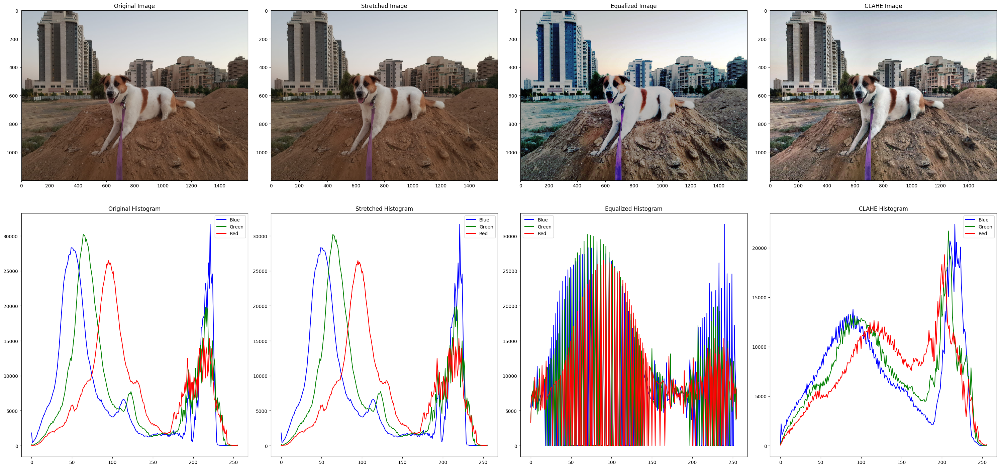

In [12]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Read the image in color
img = cv2.imread('25.jpeg')

# Split the image into color channels
b, g, r = cv2.split(img)

# Function to apply histogram equalization
def process_channel(channel):
    # Histogram Stretching
    min_val = np.min(channel)
    max_val = np.max(channel)
    stretched = ((channel - min_val) / (max_val - min_val)) * 255
    stretched = stretched.astype(np.uint8)

    # Histogram Equalization
    equalized = cv2.equalizeHist(channel)

    # CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(channel)

    return stretched, equalized, clahe_img

# Process each channel
b_stretched, b_equalized, b_clahe = process_channel(b)
g_stretched, g_equalized, g_clahe = process_channel(g)
r_stretched, r_equalized, r_clahe = process_channel(r)

# Recombine processed channels
stretched_img = cv2.merge([b_stretched, g_stretched, r_stretched])
equalized_img = cv2.merge([b_equalized, g_equalized, r_equalized])
clahe_img = cv2.merge([b_clahe, g_clahe, r_clahe])

# Image display
plt.figure(figsize=(30, 15))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(2, 4, 2)
plt.imshow(cv2.cvtColor(stretched_img, cv2.COLOR_BGR2RGB))
plt.title('Stretched Image')

plt.subplot(2, 4, 3)
plt.imshow(cv2.cvtColor(equalized_img, cv2.COLOR_BGR2RGB))
plt.title('Equalized Image')

plt.subplot(2, 4, 4)
plt.imshow(cv2.cvtColor(clahe_img, cv2.COLOR_BGR2RGB))
plt.title('CLAHE Image')

# Histograms
plt.subplot(2, 4, 5)
plt.title('Original Histogram')
plt.plot(cv2.calcHist([b],[0],None,[256],[0,256]), color='b', label='Blue')
plt.plot(cv2.calcHist([g],[0],None,[256],[0,256]), color='g', label='Green')
plt.plot(cv2.calcHist([r],[0],None,[256],[0,256]), color='r', label='Red')
plt.legend()

plt.subplot(2, 4, 6)
plt.title('Stretched Histogram')
plt.plot(cv2.calcHist([b_stretched],[0],None,[256],[0,256]), color='b', label='Blue')
plt.plot(cv2.calcHist([g_stretched],[0],None,[256],[0,256]), color='g', label='Green')
plt.plot(cv2.calcHist([r_stretched],[0],None,[256],[0,256]), color='r', label='Red')
plt.legend()

plt.subplot(2, 4, 7)
plt.title('Equalized Histogram')
plt.plot(cv2.calcHist([b_equalized],[0],None,[256],[0,256]), color='b', label='Blue')
plt.plot(cv2.calcHist([g_equalized],[0],None,[256],[0,256]), color='g', label='Green')
plt.plot(cv2.calcHist([r_equalized],[0],None,[256],[0,256]), color='r', label='Red')
plt.legend()

plt.subplot(2, 4, 8)
plt.title('CLAHE Histogram')
plt.plot(cv2.calcHist([b_clahe],[0],None,[256],[0,256]), color='b', label='Blue')
plt.plot(cv2.calcHist([g_clahe],[0],None,[256],[0,256]), color='g', label='Green')
plt.plot(cv2.calcHist([r_clahe],[0],None,[256],[0,256]), color='r', label='Red')
plt.legend()

plt.tight_layout()
plt.show()

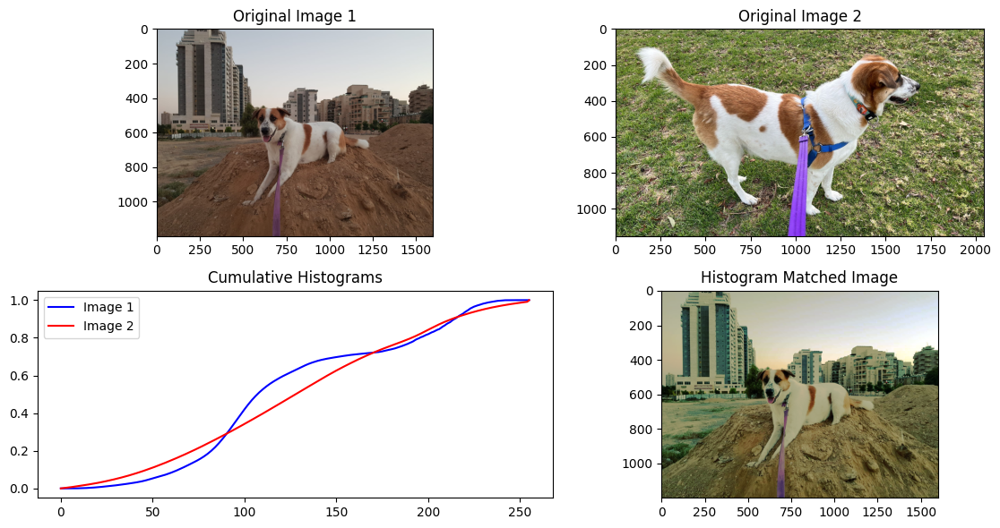

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def histogram_match(image1_path, image2_path):
    # Load images
    img1 = cv2.imread(image1_path)
    img2 = cv2.imread(image2_path)

    if img1 is None or img2 is None:
        raise ValueError("Unable to read images")

    # Ensure images are in BGR format (3 channels)
    if img1.shape[-1] == 4:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGRA2BGR)
    if img2.shape[-1] == 4:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGRA2BGR)

    # Split into channels
    channels1 = cv2.split(img1)
    channels2 = cv2.split(img2)

    matched_channels = []

    for ch1, ch2 in zip(channels1, channels2):
        # Compute histograms
        hist1, _ = np.histogram(ch1.flatten(), 256, [0, 256])
        hist2, _ = np.histogram(ch2.flatten(), 256, [0, 256])

        # Compute normalized CDFs
        cdf1 = hist1.cumsum()
        cdf1 = (cdf1 - cdf1.min()) / (cdf1.max() - cdf1.min())
        cdf2 = hist2.cumsum()
        cdf2 = (cdf2 - cdf2.min()) / (cdf2.max() - cdf2.min())

        # Generate lookup table
        lut = np.searchsorted(cdf2, cdf1)
        lut = np.clip(lut, 0, 255).astype(np.uint8)

        # Apply LUT to the source channel
        matched_ch = cv2.LUT(ch1, lut)
        matched_channels.append(matched_ch)

    # Merge channels and convert to uint8
    matched_img = cv2.merge(matched_channels)

    # Display results
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title('Original Image 1')
    plt.subplot(2, 2, 2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title('Original Image 2')
    plt.subplot(2, 2, 4)
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.title('Histogram Matched Image')
    plt.subplot(2, 2, 3)
    plt.plot(cdf1, color='b')
    plt.plot(cdf2, color='r')
    plt.title('Cumulative Histograms')
    plt.legend(['Image 1', 'Image 2'])
    plt.tight_layout()
    plt.show()



# Example usage
histogram_match( '/content/25.jpeg','/content/18.jpg')

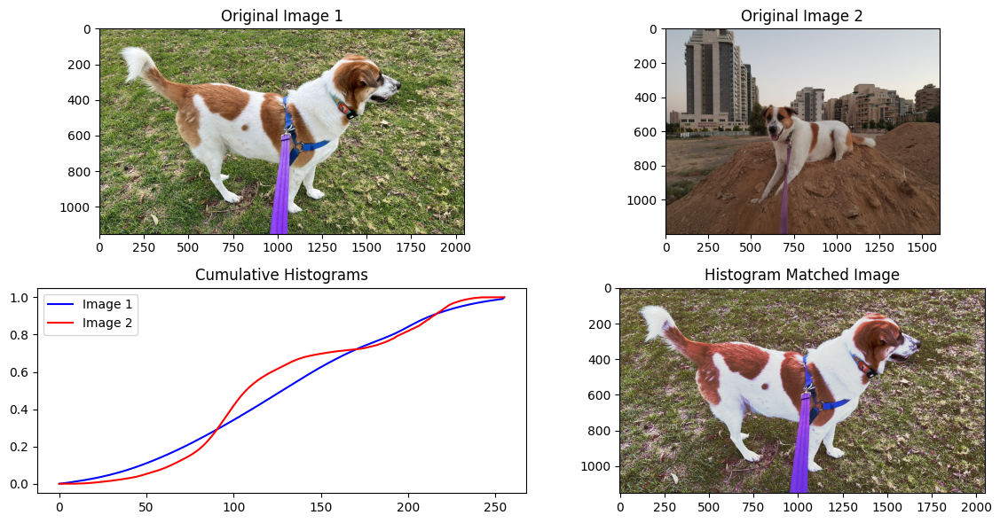

In [27]:
histogram_match( '/content/18.jpg','/content/25.jpeg')

In [ ]:
"""
5)  Name three common noise reduction filters and describe their primary use cases. - Gaussian smoothing, kernel based filtering, median filtering
6)  What is the main difference between Gaussian and median filters in noise reduction? - Gaussian takes the wighted average vs medien replaces the with the median
7)  What is the purpose of edge detection in image processing? - detceting inteinsty changes in order to prepare the imagge for other algos or reduce the obejets to there outline.
8)  Explain how the Canny edge detector minimizes errors while identifying edges. it suses  several process of nosie reduction and processing like filtering and non maxsinum supprission

"""


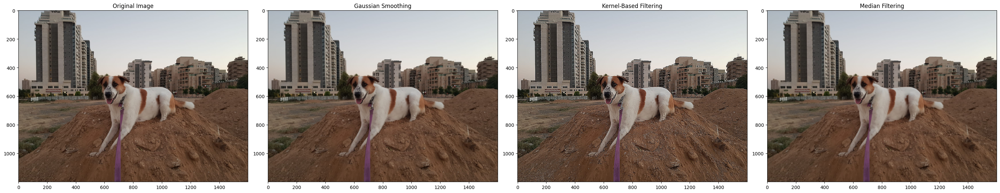

In [30]:
# lets demonstarte Gaussian smoothing, kerenl based filtering, median filtering

import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image (replace 'your_image.jpg' with your image file)
img = cv2.imread('25.jpeg')

# 1. Gaussian Smoothing
gaussian_blurred = cv2.GaussianBlur(img, (5, 5), 0)  # Kernel size (5, 5), sigma=0

# 2. Kernel-Based Filtering (Example: Sharpening)
kernel = np.array([[-1,-1,-1],
                   [-1, 9,-1],
                   [-1,-1,-1]])
kernel_filtered = cv2.filter2D(img, -1, kernel)


# 3. Median Filtering
median_filtered = cv2.medianBlur(img, 5)  # Kernel size 5


# Display the results
plt.figure(figsize=(30, 15))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 4, 2)
plt.imshow(cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2RGB))
plt.title('Gaussian Smoothing')

plt.subplot(1, 4, 3)
plt.imshow(cv2.cvtColor(kernel_filtered, cv2.COLOR_BGR2RGB))
plt.title('Kernel-Based Filtering')

plt.subplot(1, 4, 4)
plt.imshow(cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB))
plt.title('Median Filtering')

plt.tight_layout()
plt.show()

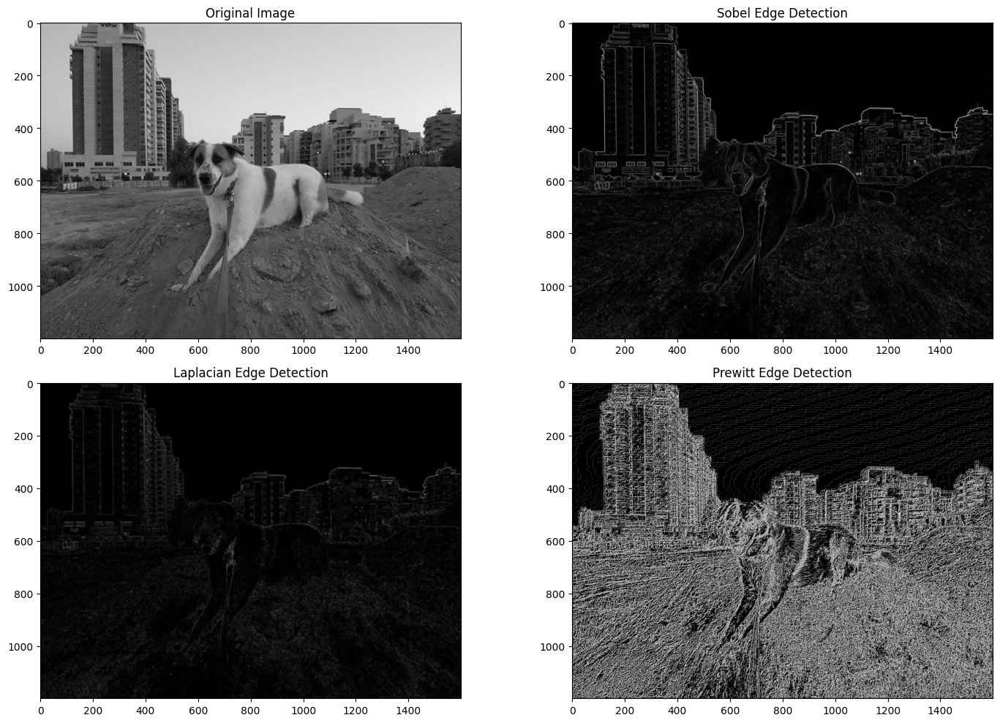

In [43]:

import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
img = cv2.imread('25.jpeg', cv2.IMREAD_GRAYSCALE)  # Load as grayscale

# Apply different edge detection methods
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
sobel = np.sqrt(sobelx**2 + sobely**2)

# Laplacian
laplacian = cv2.Laplacian(img, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)  # Take absolute value and convert to uint8

prewitt_kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewitt_kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
prewittx = cv2.filter2D(img, -1, prewitt_kernel_x)
prewitty = cv2.filter2D(img, -1, prewitt_kernel_y)
prewitt = np.sqrt(prewittx**2 + prewitty**2)

# Display the results
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(sobel, cmap='gray')
plt.title('Sobel Edge Detection')

plt.subplot(2, 2, 3)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Edge Detection')

plt.subplot(2, 2, 4)
plt.imshow(prewitt, cmap='gray')
plt.title('Prewitt Edge Detection')

plt.tight_layout()
plt.show()

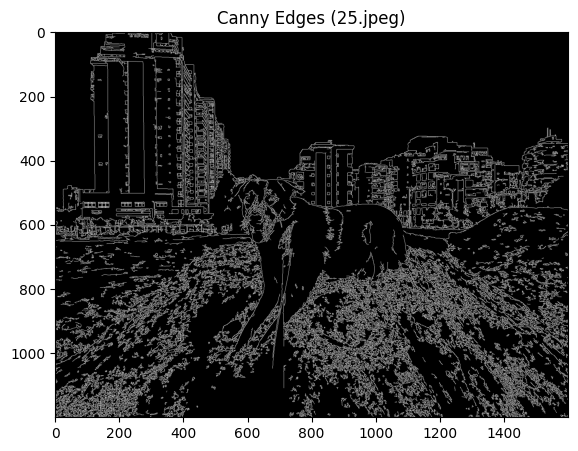

In [46]:
# Canny Edge Detection
def canny_edge_detection(image_path, low_threshold=50, high_threshold=150):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error: Could not read image at {image_path}")
        return

    edges = cv2.Canny(img, low_threshold, high_threshold)
    return edges

# Example usage

edges_25 = canny_edge_detection('/content/25.jpeg')

# Display the results
plt.figure(figsize=(10, 5))
plt.imshow(edges_25, cmap='gray')
plt.title('Canny Edges (25.jpeg)')
plt.show()

In [ ]:
"""
9)  What are the key steps involved in the Canny edge detection process? - nosie reduction, find intesity gradient , non max suppression, double thesholding, edge tracking and hysteresis thresholding.
10) What is the Laplacian of Gaussian (LoG) filter, and how does it combine noise reduction with edge detection? - its a two step process first nosie resmoothing with a gaussian filter and then aplly laplacian
11) What is the difference between Gaussian and Laplacian pyramids, and how are they used in image blending? the laplacian is  built from the gasusian but it stores the the diffrencess between the original and the gasussian  smoothed image.
12) How can histogram processing techniques, such as matching or equalization, improve images taken under varying lighting conditions? - by playning with the color levels of the histograms we can increase the level of brightness or decrease it as wee please
"""

In [ ]:
# Lecture 4

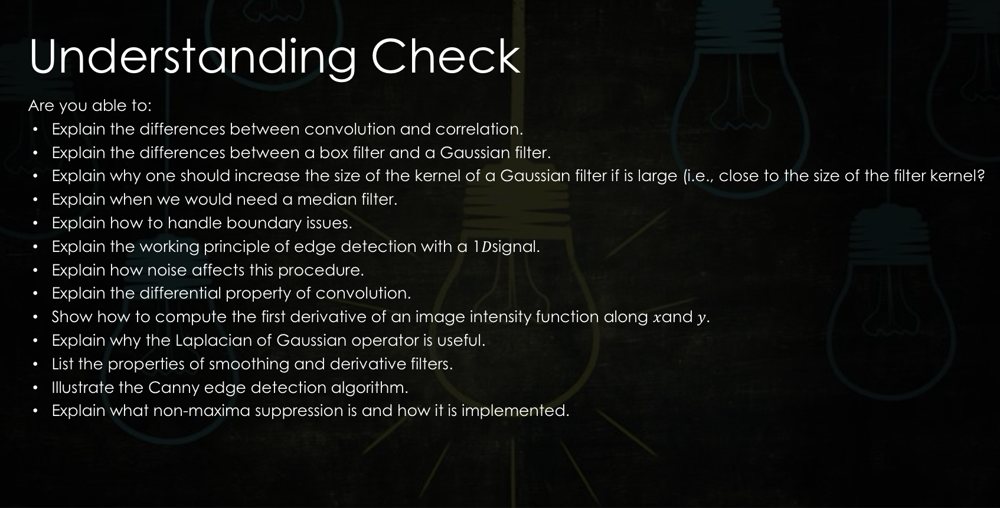

In [ ]:
"""
1) Explain the differences between convolution and correlation. - kernel is flipped before appliction in conv, theres symmetry in conv,
2)  Explain the differences between a box filter and a Gaussian filter. -   Gaussian takes the wighted average vs medien replaces the with the mean
3)  Explain why one should increase the size of the kernel of a Gaussian filter if it is large (i.e., close to the size of the filter kernel).
4)  Explain when we would need a median filter. particularly effective in scenarios where the noise is impulsive or salt-and-pepper in nature
5)  Explain how to handle boundary issues. adding padding
6)  Explain the working principle of edge detection with a 1D signal. -analyzing the derivative of the signal, as edges are characterized by rapid changes in intensity.
7)  Explain how noise affects this procedure. - nosie can lead to false edge detection or missed edges.
8)  Explain the differential property of convolution. - derivative of a convolution of two functions is equal to the convolution of one function with the derivative of the other.
9)  Show how to compute the first derivative of an image intensity function along x and y.
"""

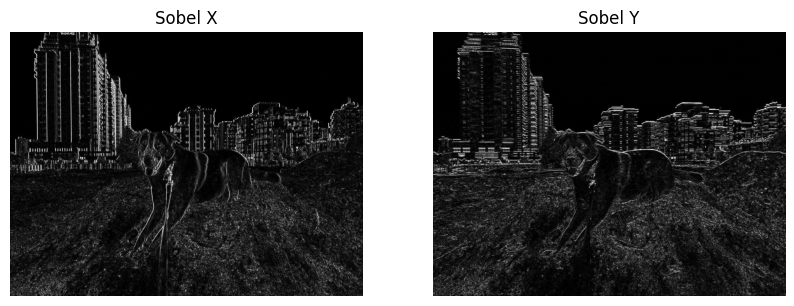

In [49]:
# Load image (convert to grayscale if needed)
image = cv2.imread('25.jpeg', cv2.IMREAD_GRAYSCALE)

# Compute derivatives using Sobel operator
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # Derivative along x
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Derivative along y

# Normalize and convert to absolute values
sobel_x = cv2.convertScaleAbs(sobel_x)
sobel_y = cv2.convertScaleAbs(sobel_y)

# Display the results using matplotlib
plt.figure(figsize=(10, 5))

# Display Sobel X
plt.subplot(1, 2, 1)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X')
plt.axis('off')  # Hide axes

# Display Sobel Y
plt.subplot(1, 2, 2)
plt.imshow(sobel_y, cmap='gray')
plt.title('Sobel Y')
plt.axis('off')  # Hide axes

plt.show()

In [ ]:
"""
10) Explain why the Laplacian of Gaussian operator is useful. -  it effectively detects edges and blobs in images by combining Gaussian smoothing to reduce noise and the Laplacian to highlight regions of rapid intensity change
11) List the properties of smoothing and derivative filters. ??
12) Illustrate the Canny edge detection algorithm.  - was done earlier
13) Explain what non-maxima suppression is and how it is implemented. -  is a technique used in edge detection algorithms (e.g., Canny edge detector) to thin out edges and retain only the local maxima in the gradient magnitude of an image.
                                                                         The goal is to ensure that edges are represented as thin lines rather than thick regions
"""

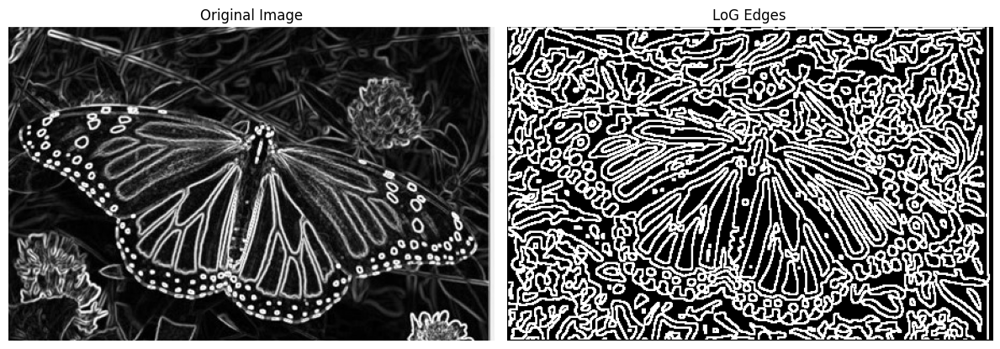

In [91]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

# Step 1: Load the image
image = cv2.imread('צילום מסך 2025-01-26 203321.jpg', cv2.IMREAD_GRAYSCALE)
if image is None:
    print("Image not found. Check the file path.")
    exit()

# Step 2: Define a Laplacian of Gaussian (LoG) filter
def create_log_kernel(size, sigma):
    """
    Create a Laplacian of Gaussian kernel.
    :param size: Size of the kernel (must be odd).
    :param sigma: Standard deviation of the Gaussian.
    :return: LoG kernel.
    """
    k = size // 2
    y, x = np.mgrid[-k:k+1, -k:k+1]
    gaussian = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    gaussian /= gaussian.sum()
    laplacian = (x**2 + y**2 - 2 * sigma**2) / (sigma**4) * gaussian
    return laplacian - laplacian.mean()  # Normalize the kernel

# Parameters for LoG
kernel_size = 21  # Kernel size (odd number)
sigma = 2.5 # Standard deviation of the Gaussian

log_kernel = create_log_kernel(kernel_size, sigma)

# Step 3: Apply the LoG filter
log_image = convolve(image.astype(np.float32), log_kernel)

# Step 4: Detect zero-crossings
def detect_zero_crossings(log_image):
    """
    Detect zero-crossings in the filtered image.
    :param log_image: Laplacian of Gaussian filtered image.
    :return: Binary edge map.
    """
    zero_crossings = np.zeros_like(log_image, dtype=np.uint8)
    rows, cols = log_image.shape

    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            # Extract the 3x3 neighborhood
            neighborhood = log_image[i-1:i+2, j-1:j+2]
            # Check for sign changes (positive to negative or vice versa)
            if np.any(neighborhood < 0) and np.any(neighborhood > 0):
                zero_crossings[i, j] = 255
    return zero_crossings

edges = detect_zero_crossings(log_image)

# Step 5: Visualize results
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# LoG edges
plt.subplot(1, 2, 2)
plt.imshow(edges, cmap='gray')
plt.title('LoG Edges')
plt.axis('off')

plt.tight_layout()
plt.show()


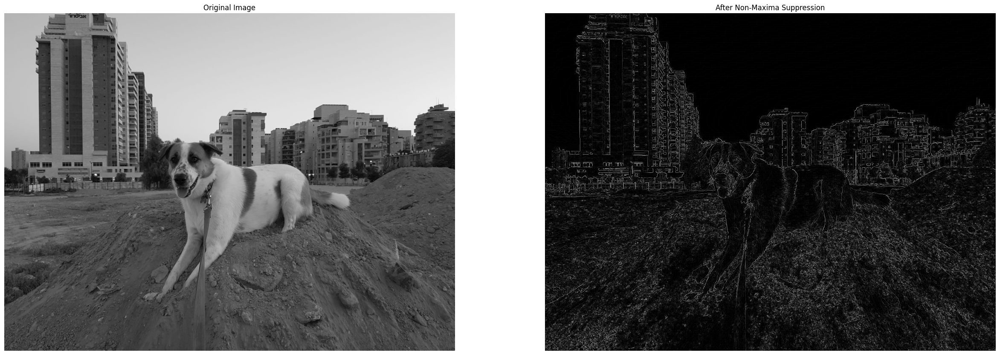

In [95]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def non_maxima_suppression(gradient_magnitude, gradient_direction):
    # Quantize gradient directions into 4 primary directions
    angle = gradient_direction * 180. / np.pi
    angle[angle < 0] += 180  # Convert negative angles to positive

    # Create an empty matrix to store the result
    suppressed = np.zeros_like(gradient_magnitude, dtype=np.uint8)

    # Iterate over each pixel (excluding border pixels)
    for i in range(1, gradient_magnitude.shape[0] - 1):
        for j in range(1, gradient_magnitude.shape[1] - 1):
            # Determine the neighbors to compare based on gradient direction
            if (0 <= angle[i, j] < 22.5) or (157.5 <= angle[i, j] <= 180):
                neighbors = [gradient_magnitude[i, j - 1], gradient_magnitude[i, j + 1]]
            elif 22.5 <= angle[i, j] < 67.5:
                neighbors = [gradient_magnitude[i - 1, j - 1], gradient_magnitude[i + 1, j + 1]]
            elif 67.5 <= angle[i, j] < 112.5:
                neighbors = [gradient_magnitude[i - 1, j], gradient_magnitude[i + 1, j]]
            elif 112.5 <= angle[i, j] < 157.5:
                neighbors = [gradient_magnitude[i - 1, j + 1], gradient_magnitude[i + 1, j - 1]]

            # Retain the pixel if it is a local maximum
            if gradient_magnitude[i, j] >= max(neighbors):
                suppressed[i, j] = gradient_magnitude[i, j]

    return suppressed

# Example usage
# Load image and convert to grayscale
image = cv2.imread('25.jpeg', cv2.IMREAD_GRAYSCALE)

# Compute gradients using Sobel operator
gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

# Compute gradient magnitude and direction
gradient_magnitude = np.hypot(gradient_x, gradient_y)
gradient_direction = np.arctan2(gradient_y, gradient_x)

# Apply non-maxima suppression
suppressed = non_maxima_suppression(gradient_magnitude, gradient_direction)

# Display results
plt.figure(figsize=(30, 15))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(suppressed, cmap='gray')
plt.title('After Non-Maxima Suppression')
plt.axis('off')

plt.show()